<a href="https://colab.research.google.com/github/starrykirkland/CDS540/blob/main/Assignment_1_Zhao_Wenqing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Setup Environment
!pip install Pillow
!pip install pytesseract
!apt-get update
!apt-get install -y tesseract-ocr
!apt-get install -y libtesseract-dev

import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from matplotlib import pyplot as plt
import pytesseract
from PIL import Image
from pytesseract import Output

pytesseract.pytesseract.tesseract_cmd = r'/usr/bin/tesseract'

Hit:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Ign:2 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy Release
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:7 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:10 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading pac

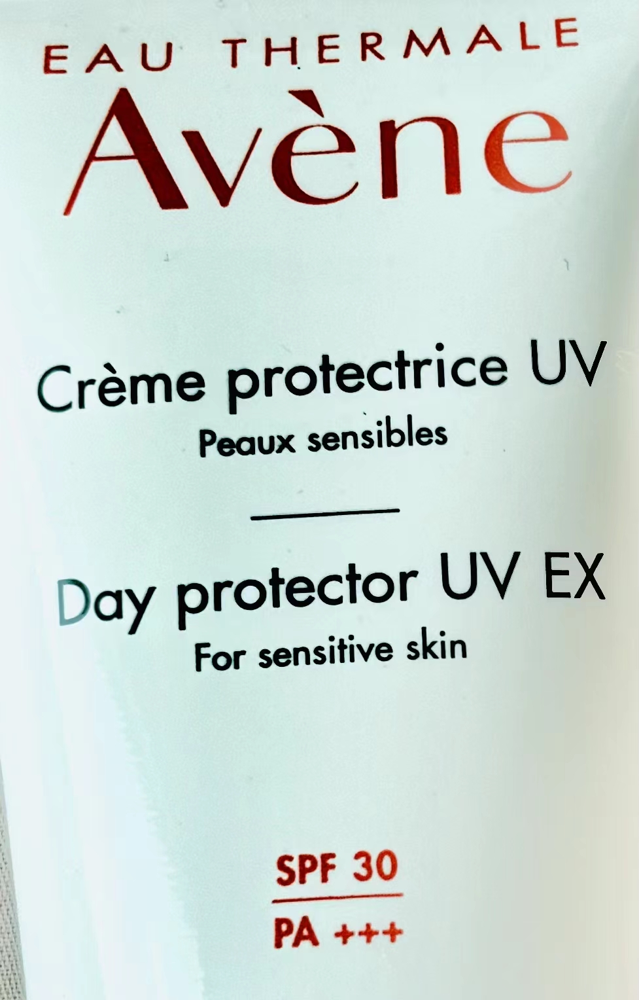

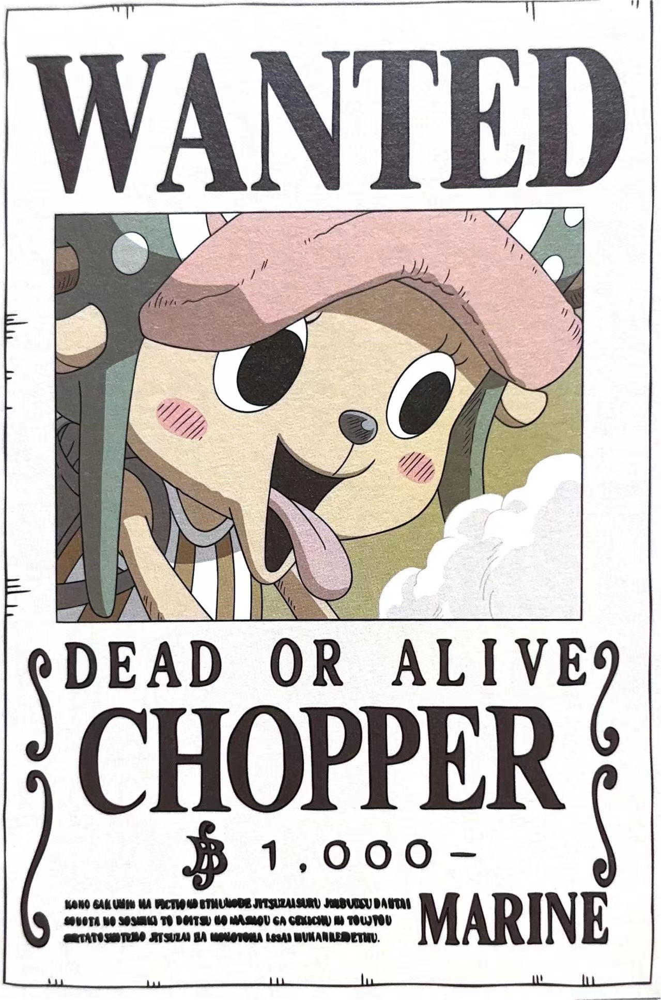

In [ ]:
# Load an Image
img1 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/CDS540assignment1.jpg')
img2 = cv2.imread('/content/drive/MyDrive/Colab Notebooks/CDS540assignment2.jpg')
cv2_imshow(img1)
cv2_imshow(img2)

In [ ]:
#Record code speed
import time
start_time = time.time()

In [ ]:
# Preprocess the Image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def thresholding1(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

def thresholding2(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_TOZERO + cv2.THRESH_OTSU)[1]

def remove_noise(image):
    return cv2.medianBlur(image, 1) #Figure 1 needs to be adjusted to 1, Figure 2 needs to be adjusted to 5

def canny(image):
    return cv2.Canny(image, 100, 200)

def edge(image):
    return cv2.bitwise_not(image)

gray = get_grayscale(img1) #change this viriable to swift the image
binary = thresholding1(gray)
tozero = thresholding2(gray)
processed1 = remove_noise(binary)
processed2 = remove_noise(tozero)
canny = canny(processed1)
edge = edge(canny)

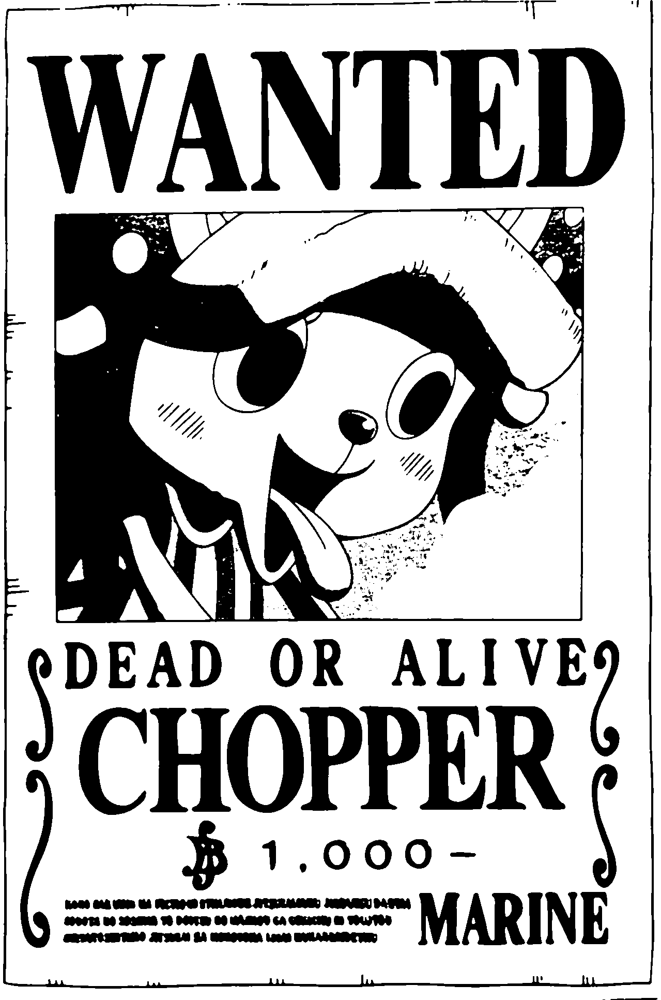

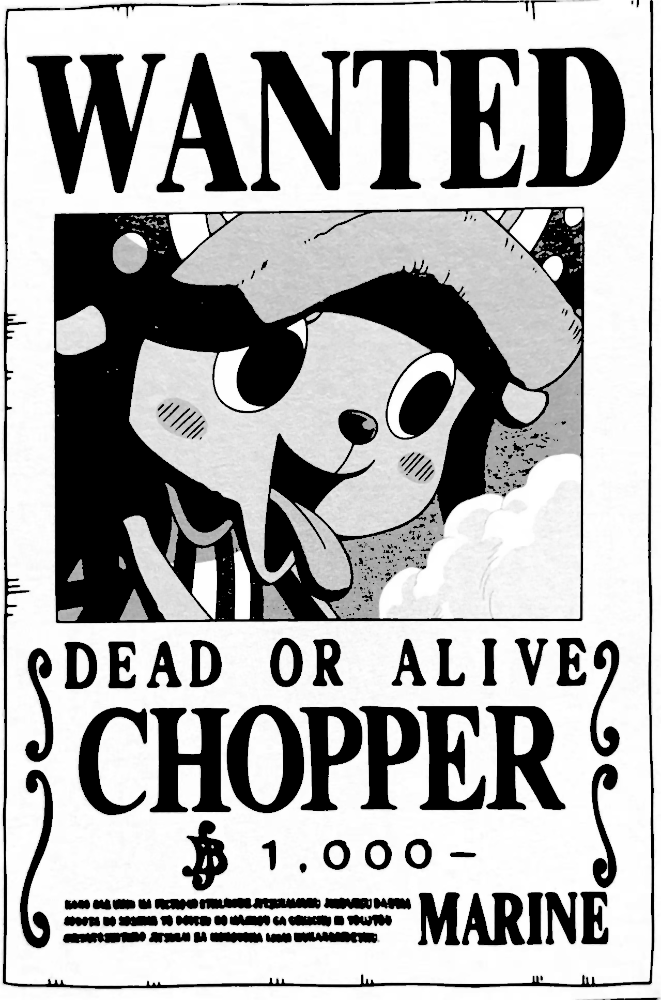

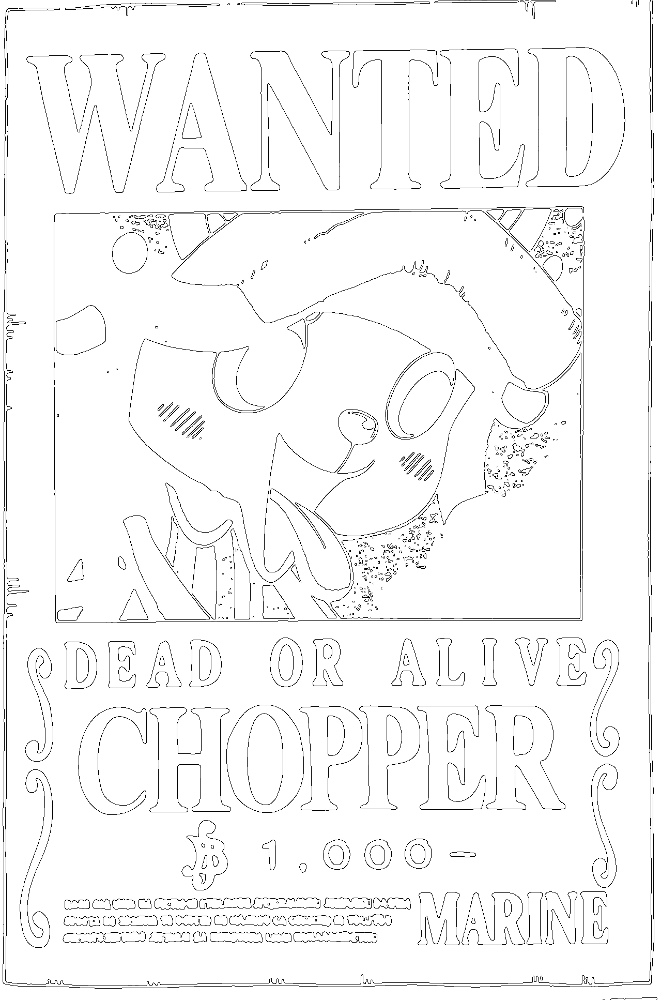

In [ ]:
cv2_imshow(processed1)
cv2_imshow(processed2)
cv2_imshow(edge)

In [ ]:
# Text Detection
custom_config = r'--oem 3 --psm 6'
d = pytesseract.image_to_data(processed1, config=custom_config, output_type=pytesseract.Output.DICT) #Adjusting the first parameter can test the text recognition accuracy of images processed in different ways.
print(d)
print("Number of text areas detected:", len(d['text']))

{'level': [1, 2, 3, 4, 5, 4, 5, 5, 5, 5, 4, 5, 4, 5, 5, 5, 4, 5, 5, 5], 'page_num': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'block_num': [0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'par_num': [0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'line_num': [0, 0, 0, 1, 1, 2, 2, 2, 2, 2, 3, 3, 4, 4, 4, 4, 5, 5, 5, 5], 'word_num': [0, 0, 0, 0, 1, 0, 1, 2, 3, 4, 0, 1, 0, 1, 2, 3, 0, 1, 2, 3], 'left': [0, 9, 9, 9, 9, 49, 49, 523, 758, 996, 152, 152, 352, 352, 507, 1145, 140, 140, 809, 1055], 'top': [0, 1, 0, 1, 1, 1221, 1238, 1234, 1235, 1221, 1364, 1364, 1478, 1587, 1623, 1478, 1718, 1718, 1722, 1725], 'width': [1279, 1201, 1227, 1201, 1201, 1148, 373, 141, 203, 201, 942, 942, 831, 89, 414, 38, 1037, 526, 234, 122], 'height': [1934, 1899, 1896, 374, 374, 252, 235, 95, 92, 246, 212, 212, 244, 135, 65, 239, 182, 137, 178, 102], 'conf': [-1, -1, -1, -1, 96, -1, 35, 95, 95, 42, -1, 96, -1, 0, 77, 53, -1, 19, 96, 96], 'text': ['', '', '', '', 'W

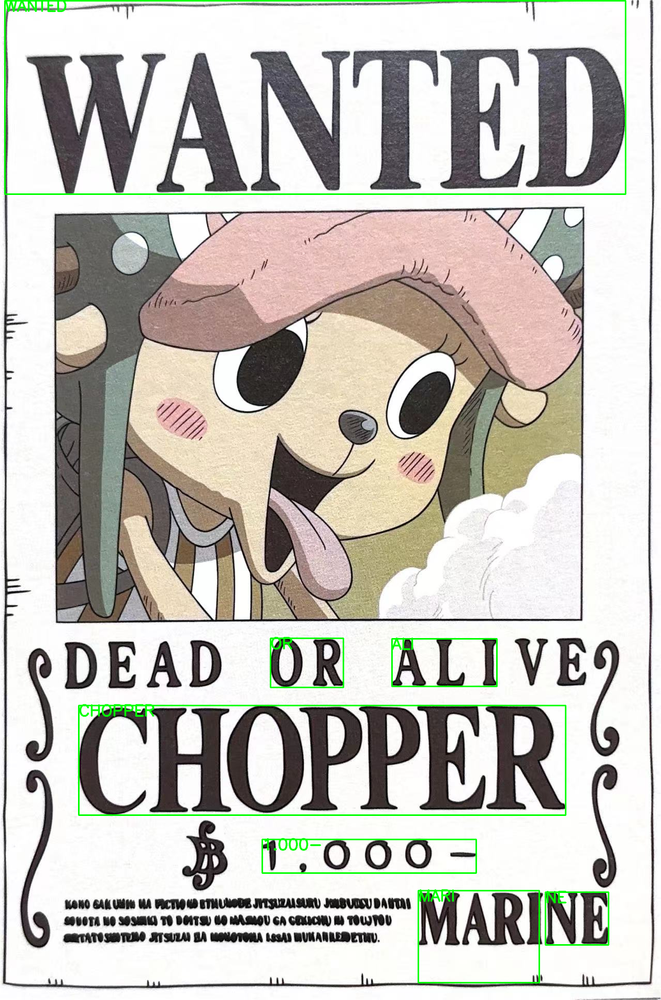

THE TEXT IS：
WANTED
Wey OR ALI ye?
CHOPPER
BB 1.000- (
————— MARI NE



In [ ]:
confidence_threshold = 70
for i in range(len(d['text'])):
    if int(d['conf'][i]) > confidence_threshold:
        (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
        result1 = cv2.rectangle(img1, (x, y), (x + w, y + h), (0, 255, 0), 2)
        result1 = cv2.putText(img1, d['text'][i], (x, y + 20), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2, cv2.LINE_AA)
cv2_imshow(result1)

print("THE TEXT IS：")
text = pytesseract.image_to_string(processed1, config=custom_config) #After inspection, it was found that processed1 was the most accurate.
print(text)

In [ ]:
end_time = time.time()
processing_time = end_time - start_time
print(f"Processing time: {processing_time:.2f} s")

Processing time: 6.82 s
